I am just curious about how representative of the daily confirmed cases of covid-19 in each country. So I decided to plot the daily reports and compare with Benford's law. 
It's out of my specialization so there's no gurantee in the accuracy and quality of this analysis. Be doubtful and just for fun.

The covid-19 data is accessed from JHU data https://github.com/CSSEGISandData/COVID-19/
Shunan Feng: fsn.1995@gmail.com

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

In [55]:
#%% load data
urlcovid = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
df = pd.read_csv(urlcovid)
df = df.groupby('Country/Region').sum()
df.reset_index(inplace=True)
country = df['Country/Region']
df = df.drop(columns=['Lat','Long','Country/Region'])

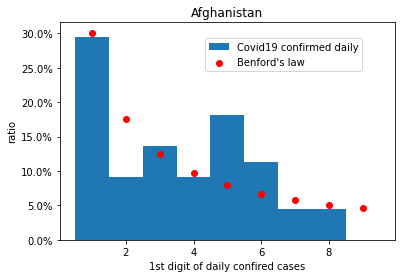

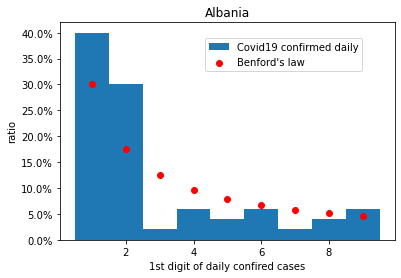

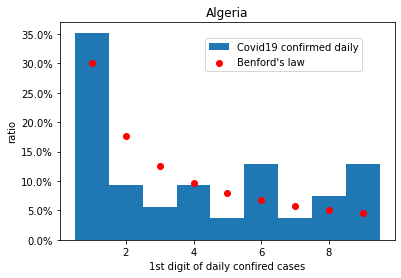

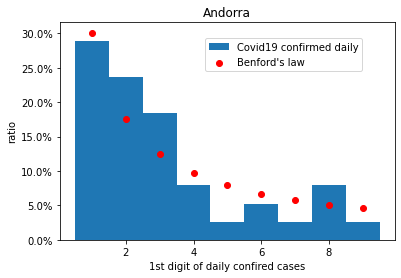

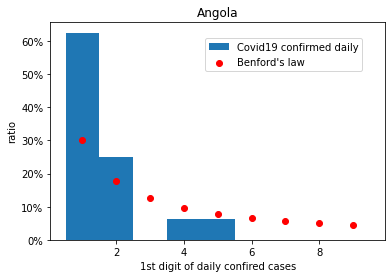

...

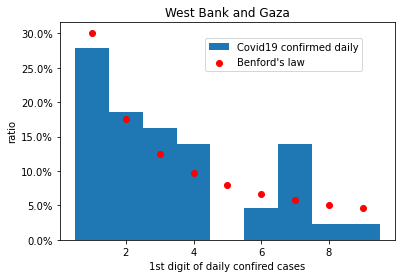

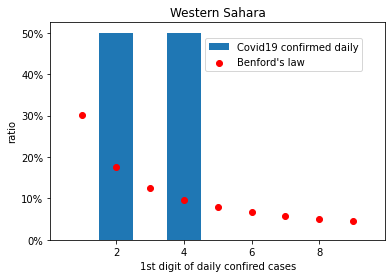

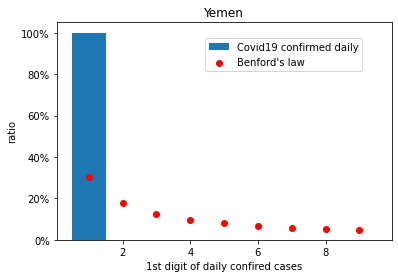

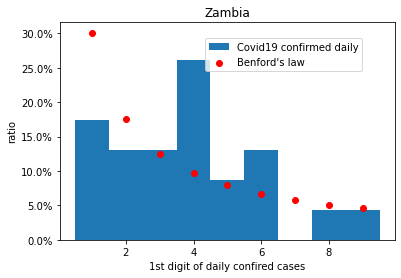

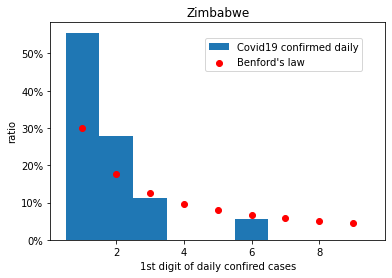

In [56]:
# %% processing
covid19 = df.to_numpy()
covid19 = np.diff(covid19)
covid19[np.where(covid19<1)] = 0
for i in range(len(country)):
    countryname = country[i]
    covidConfirmed = covid19[i,:]
    for j in range(len(covidConfirmed)):
        digi1st = np.int64(str(covidConfirmed[j])[0])
        covidConfirmed[j] = digi1st
    covidConfirmed = covidConfirmed.astype(float)
    covidConfirmed[np.where(covidConfirmed<1)] = np.nan
    fig, ax1 = plt.subplots()
    ax1.set(title = countryname, xlabel = '1st digit of daily confired cases', ylabel = 'ratio')
    nbins = np.linspace(0.5, 9.5, 10)
    ax1.hist(covidConfirmed, bins = nbins, density = True, label = 'Covid19 confirmed daily')
    # ax1.yaxis.set_major_formatter(PercentFormatter(xmax=1))
    # ax2 = ax1.twinx()
    # ax2.set(ylabel = '%')
    x1 = np.linspace(1, 9, 9)
    y1 = np.log10(1 + 1/x1) 
    ax1.scatter(x1, y1,c='r', label = r"Benford's law", zorder = 3)
    ax1.yaxis.set_major_formatter(PercentFormatter(xmax=1))
    fig.legend(loc='upper right', bbox_to_anchor=(0.85, 0.85))
    # ax = plt.hist(np.histogram(covidConfirmed))